# Setup

In [1]:
import os
import random
from copy import deepcopy
from dataclasses import dataclass
from tqdm import tqdm


import torch
from torch.distributions.normal import Normal
from torch.distributions.uniform import Uniform
import numpy as np
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader
from datasets import load_dataset
from transformers import get_cosine_schedule_with_warmup
from diffusers import (
    StableDiffusionPipeline, 
    StableDiffusionImg2ImgPipeline,
    StableDiffusionInpaintPipeline, 
    StableDiffusionDepth2ImgPipeline
    )    
import wandb
import matplotlib.pyplot as plt

from data.datasets.web_dataset import get_dataset
from flow_models.utils import show_images, seed_everything   
from flow_models.generation import generate_euler, generate_euler_cfg, generate_midpoint, generate_midpoint_cfg

In [2]:
import yaml
from omegaconf import OmegaConf
import tempfile


with open("configs/sd2_baseline.yaml", "r") as fp:
    config = OmegaConf.load(fp.name)

In [3]:
DEVICE = "cuda:0"

In [4]:
seed_everything(config.system.random_state)
torch.set_float32_matmul_precision(config.system.pf32_precision)

In [5]:
scale = T.Lambda(
    lambda x: x * 2 - 1
)

inverse_scale = T.Lambda(
    lambda x: (x + 1) / 2
)


transform = T.Compose([
    T.ToTensor(),
    scale
])

inverse_transform = T.Compose([
    inverse_scale,
    T.Lambda(lambda x: x.permute(1, 2, 0))
])

# Generating Images from Text

In [6]:
# Load the pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    config.model.model_id,
).to(DEVICE)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

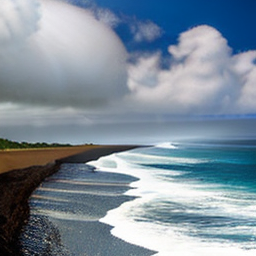

In [7]:
# Set up a generator for reproducibility
generator = torch.Generator(DEVICE).manual_seed(config.system.random_state)

# Run the pipeline, showing some of the available arguments
pipe_output = pipe(
    prompt="Surfer on maui", # What to generate
    negative_prompt="Oversaturated, blurry, low quality", # What NOT to generate
    height=256, 
    width=256,     # Specify the image size
    guidance_scale=4,          # How strongly to follow the prompt
    num_inference_steps=35,    # How many steps to take
    generator=generator        # Fixed random seed
)

# View the resulting image
pipe_output.images[0]

In [8]:
import math

approx_num_samples, dataset = get_dataset(config.data)
approx_num_batches = math.ceil(approx_num_samples / config.data.dataloader.batch_size)

dataloader = DataLoader(
        dataset,
        batch_size=config.data.dataloader.batch_size,
        num_workers=config.data.dataloader.num_workers,
        pin_memory=True,
    )

!!! DATASET SIZE !!! 278964


# Model

In [9]:
last_base_checkpoint = os.listdir("/home/jovyan/shares/SR004.nfs2/novitskiy/instructflow/checkpoints/sd_2_1_fm_generation_v1/")[-1]
last_base_checkpoint

'595000.pt'

In [10]:
base_unet = deepcopy(pipe.unet)
base_unet.load_state_dict(torch.load(f"/home/jovyan/shares/SR004.nfs2/novitskiy/instructflow/checkpoints/sd_2_1_fm_generation_v1/{last_base_checkpoint}"))

<All keys matched successfully>

In [11]:
last_rf_2_checkpoint = os.listdir("/home/jovyan/shares/SR004.nfs2/novitskiy/instructflow/checkpoints/sd_2_1_rf_2_generation_v1/")[-1]
last_rf_2_checkpoint

'29000.pt'

In [12]:
rf_unet = deepcopy(pipe.unet)
rf_unet.load_state_dict(torch.load(f"/home/jovyan/shares/SR004.nfs2/novitskiy/instructflow/checkpoints/sd_2_1_rf_2_generation_v1/{last_rf_2_checkpoint}"))

<All keys matched successfully>

In [13]:
rf_distil_checkpoints = os.listdir("/home/jovyan/shares/SR004.nfs2/novitskiy/instructflow/checkpoints/sd_2_1_rf_distill_generation_v1/")
rf_distil_checkpoints.sort(key=lambda x: int(x.split(".")[0]))
last_rf_distil_checkpoint = rf_distil_checkpoints[-1]
last_rf_distil_checkpoint

'45000.pt'

In [14]:
rf_distil_unet = deepcopy(pipe.unet)
rf_distil_unet.load_state_dict(torch.load(f"/home/jovyan/shares/SR004.nfs2/novitskiy/instructflow/checkpoints/sd_2_1_rf_distill_generation_v1/{last_rf_distil_checkpoint}"))

<All keys matched successfully>

In [15]:
immiscible_checkpoints = os.listdir("/home/jovyan/shares/SR004.nfs2/novitskiy/instructflow/checkpoints/sd_2_1_fm_generation_v3_ot/")
immiscible_checkpoints.sort(key=lambda x: int(x.split(".")[0]))
last_immiscible_checkpoint = immiscible_checkpoints[-1]
last_immiscible_checkpoint = "100000.pt"

In [16]:
immiscible_unet = deepcopy(pipe.unet)
immiscible_unet.load_state_dict(torch.load(f"/home/jovyan/shares/SR004.nfs2/novitskiy/instructflow/checkpoints/sd_2_1_fm_generation_v3_ot/{last_immiscible_checkpoint}"))

<All keys matched successfully>

In [17]:
ladd_unet = deepcopy(pipe.unet)
ladd_unet.load_state_dict(torch.load(f"/home/jovyan/shares/SR004.nfs2/novitskiy/instructflow/checkpoints/sd_2_1_ladd/student_14000.pt"))

<All keys matched successfully>

In [10]:
from torch import nn
from diffusers.models.embeddings import get_timestep_embedding


class ShortcutUnetWrapper(nn.Module):
    def __init__(self, unet, d_cond_dim: int = 768):
        super().__init__()
        self.unet = unet
        self.d_cond_dim = d_cond_dim

    def forward(self, x, t, d, encoder_hidden_states):
        d_emb = get_timestep_embedding(timesteps=d, embedding_dim=self.d_cond_dim)

        return self.unet(x, t, encoder_hidden_states=encoder_hidden_states, timestep_cond=d_emb)    

In [9]:
!ls /home/jovyan/novitskiy/FlowModels/checkpoints/sd_2_1_fm_shortcut/

10.pt	 10000.pt  15000.pt  20000.pt  300.pt  50.pt
100.pt	 150.pt    20.pt     250.pt    350.pt  500.pt
1000.pt  1500.pt   200.pt    25000.pt  400.pt  5000.pt


In [11]:
from diffusers.models.unets.unet_2d_condition import UNet2DConditionModel

shortcut_config = deepcopy(pipe.unet.config)
shortcut_config["time_cond_proj_dim"] = 768
shortcut_config

shortcut_unet = UNet2DConditionModel(**shortcut_config)
print(shortcut_unet.time_embedding.cond_proj)

shortcut_unet = ShortcutUnetWrapper(shortcut_unet, d_cond_dim=768)

shortcut_unet.load_state_dict(
    torch.load(
        f"/home/jovyan/novitskiy/FlowModels/checkpoints/sd_2_1_fm_shortcut/250.pt"
    )
)

Linear(in_features=768, out_features=320, bias=False)


<All keys matched successfully>

In [12]:
vae = pipe.vae
tokenizer = pipe.tokenizer 
text_encoder = pipe.text_encoder

In [13]:
batch = next(iter(dataloader))
batch

[tensor([[[[ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           ...,
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529]],
 
          [[ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           ...,
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           [ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529]],
 
          [[ 0.9529,  0.9529,  0.9529,  ...,  0.9529,  0.9529,  0.9529],
           [ 

# Generation

In [14]:
device = DEVICE
device

'cuda:0'

In [15]:
x_1, input_ids, attention_mask = batch
x_1, input_ids, attention_mask = x_1[:16].to(device), input_ids[:16].to(device), attention_mask[:16].to(device)

with torch.no_grad():
    x_1_latents = 0.18215 * vae.encode(x_1).latent_dist.mean

x_0_latent = torch.randn_like(x_1_latents, device=device)
x_0_latent.shape

torch.Size([16, 4, 32, 32])

In [16]:
null_prompts = [''] * 16
null_encoder_out = pipe.tokenizer(null_prompts, padding="max_length", max_length=77, return_tensors="pt")

with torch.no_grad():
    null_encoder_hidden_states = text_encoder(null_encoder_out["input_ids"].to(device), null_encoder_out["attention_mask"].to(device))['last_hidden_state']

null_encoder_hidden_states.shape

torch.Size([16, 77, 1024])

In [17]:
prompts = [
    "Yellow elephant, high resolution 4k",
    "Red jetski in the center of field with green grass, 4k high resolution",
    "DJ in Sunglasses, hight resolution",
    "Rainbow Crystall, bright, 4k",
    "Hot dog and a dog in front of an Eifel Tower",
    "Orange Kitten eating a cake",
    "Pillow and blanket sleeping on the bed in a form of a human",
    "Neuralk Network",
    "Heisenberg synthesyzed crystal sugar",
    "Window with a Mars platen in it",
    "Beautil blue Sea",
    "Surfer on Maui, high resolution, 4k",
    "Beautiful woman, high resolution, 4k",
    "Colorful baloon high resolution, 4k",
    "3 Kids playing baseball, cartoon style",
    "Researchers in the laboratory"    
]

encoder_out = pipe.tokenizer(prompts, padding="max_length", max_length=77, return_tensors="pt")

with torch.no_grad():
    encoder_hidden_states = text_encoder(encoder_out["input_ids"].to(device), encoder_out["attention_mask"].to(device))['last_hidden_state']

encoder_hidden_states.shape

torch.Size([16, 77, 1024])

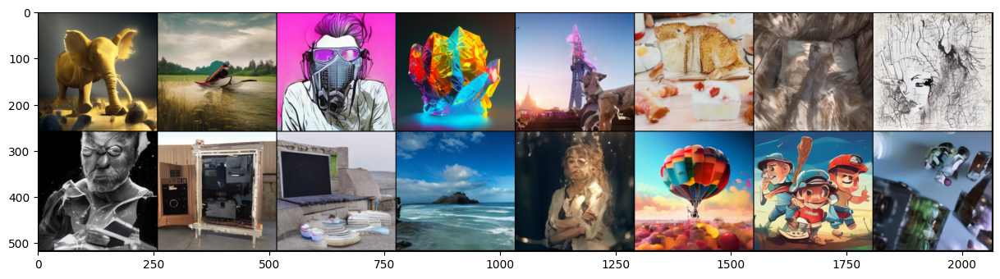

In [24]:
x_gen = generate_euler(model=base_unet, vae=vae, x_0=x_0_latent[:16], encoder_hidden_states=encoder_hidden_states[:16], device=device)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen))

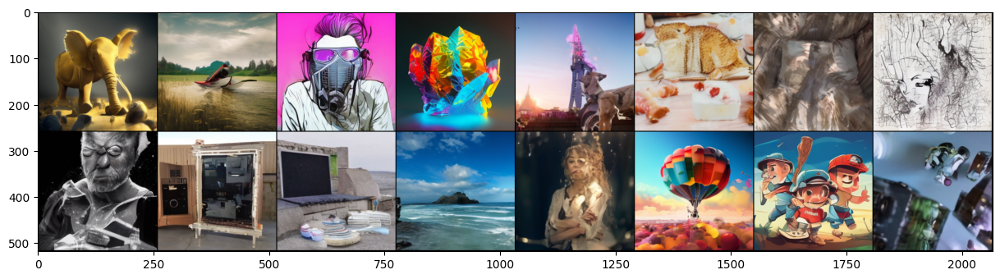

In [25]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=1,
    device=device
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

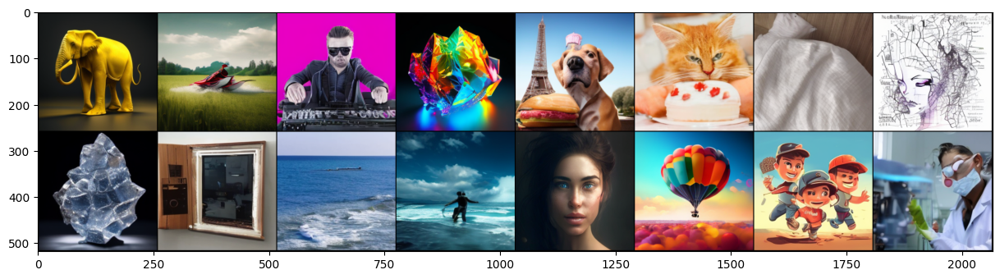

In [26]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=2,
    device=device
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

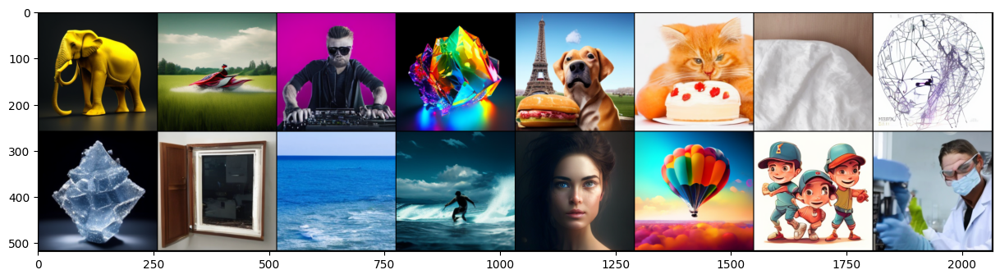

In [27]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=3,
    device=device
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

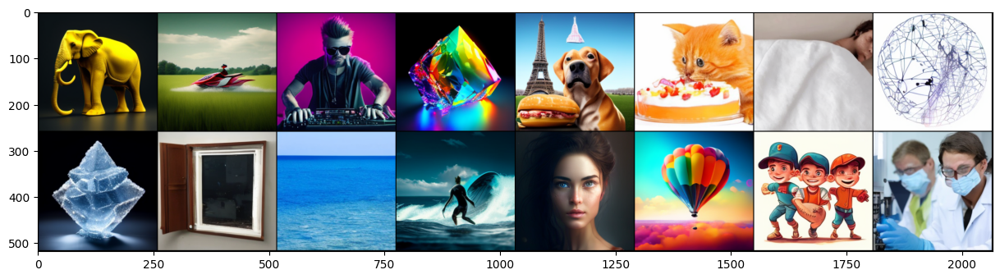

In [28]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=4,
    device=device
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

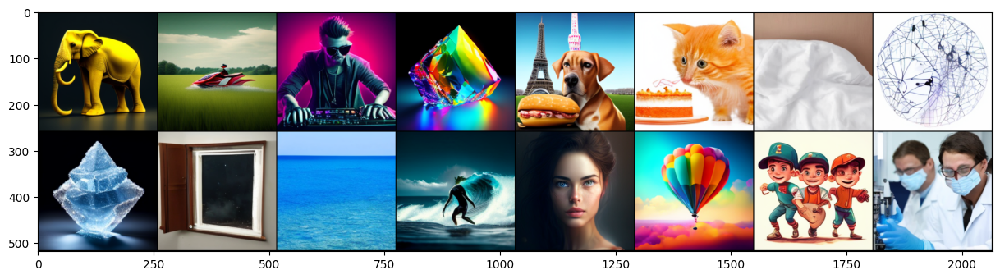

In [29]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=5,
    device=device
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

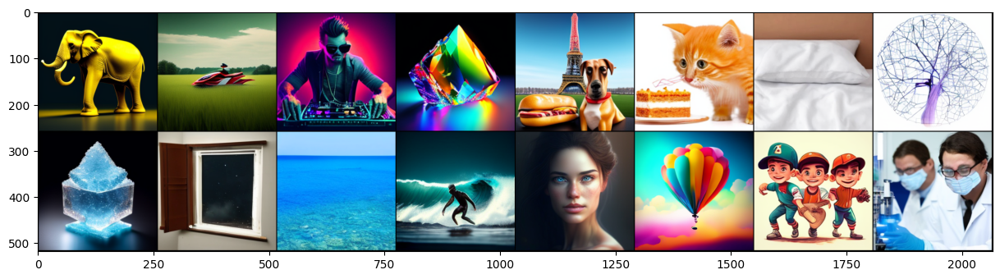

In [30]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=7,
    device=device
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

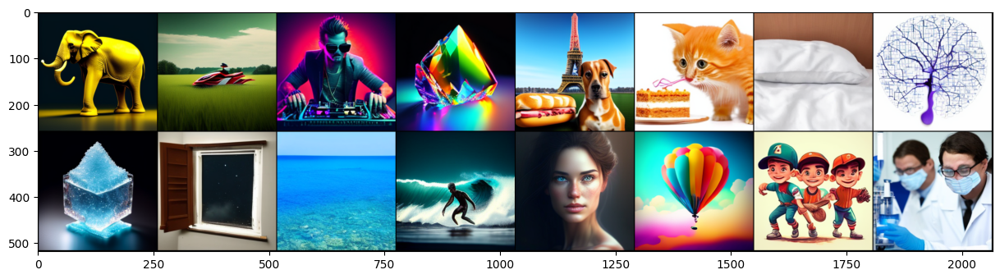

In [31]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=8,
    device=device
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

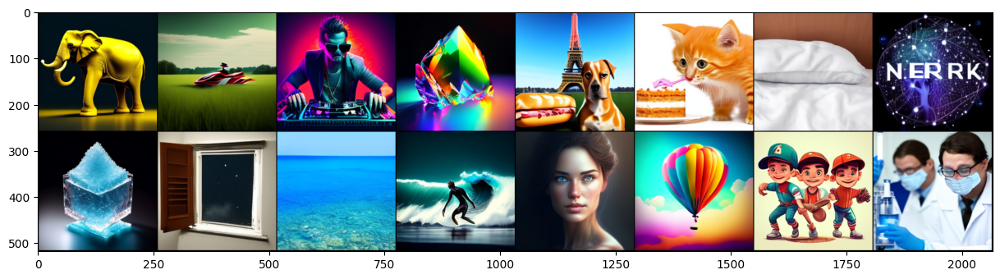

In [32]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=9,
    device=device
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

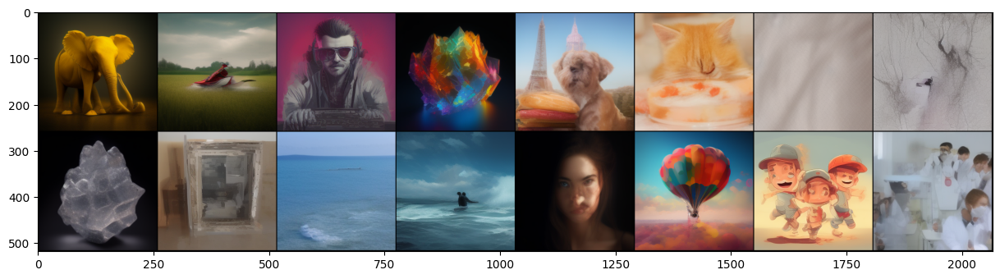

In [33]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=2,
    device=device,
    n_steps=5
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

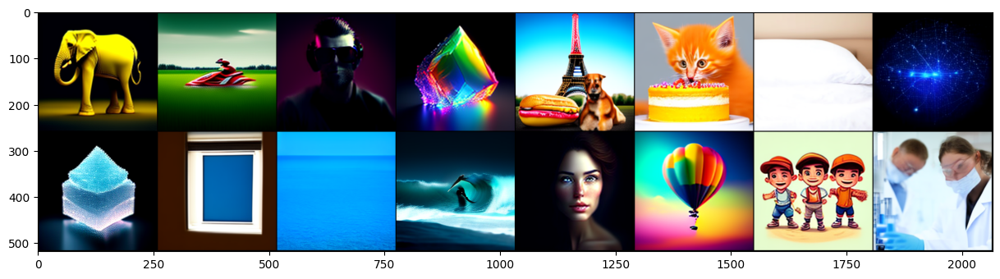

In [34]:
x_gen_cfg = generate_euler_cfg(
    model=rf_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=2,
    device=device,
    n_steps=5
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

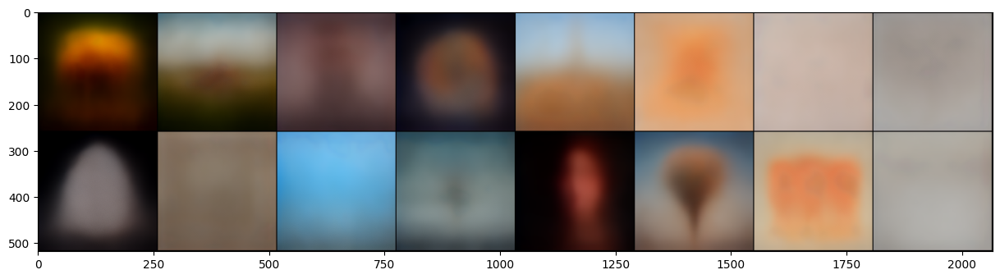

In [35]:
x_gen_cfg = generate_euler_cfg(
    model=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=2,
    device=device,
    n_steps=1
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

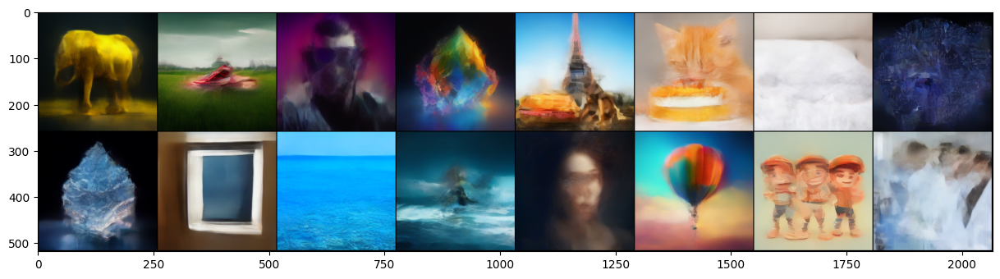

In [36]:
x_gen_cfg = generate_euler_cfg(
    model=rf_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=1,
    device=device,
    n_steps=1
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

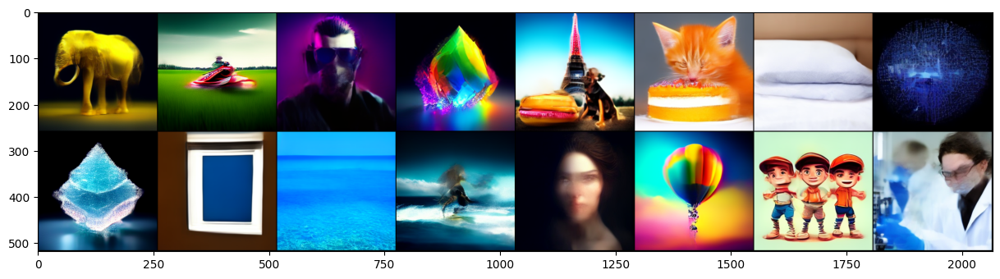

In [37]:
x_gen_cfg = generate_euler_cfg(
    model=rf_distil_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=1,
    device=device,
    n_steps=1
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

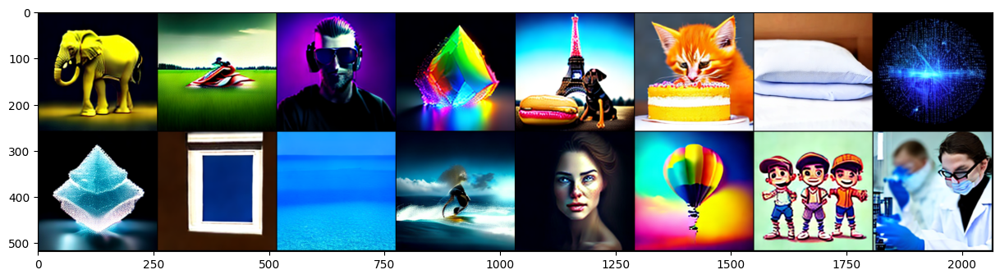

In [38]:
x_gen_cfg = generate_midpoint(
    model=rf_distil_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    device=device,
    n_steps=1
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

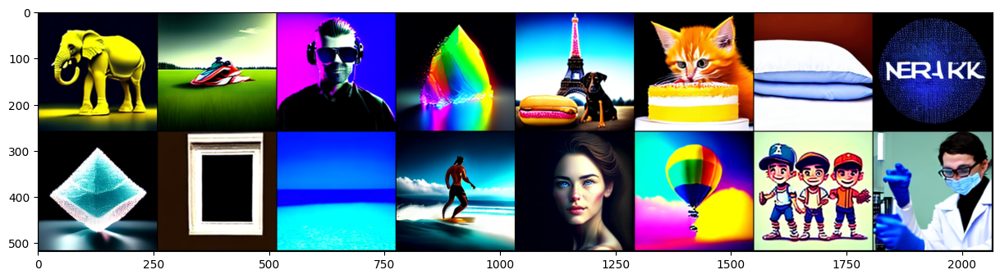

In [39]:
x_gen_cfg = generate_midpoint(
    model=rf_distil_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    device=device,
    n_steps=20
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

# LADD

In [40]:
def generate_renoise(model, vae, x_0, encoder_hidden_states, n_steps: int = 100, device: str = "cuda"):
    model.to(device)
    vae.to(device)
    model.eval()
    vae.eval()
    
    x_t = x_0.to(device)

    bs = x_0.shape[0]

    h = 1 / n_steps
    timesteps = torch.linspace(0, 1, n_steps + 1)[:-1].to(device)

    i = 0
    for t in timesteps:
        t_batch = t.unsqueeze(0).repeat((bs,))

        with torch.no_grad():
            f_eval = model(x_t, t_batch, encoder_hidden_states=encoder_hidden_states).sample
            x_t = x_t + (1 - t) * f_eval # clean x_1

            if i + 1 < n_steps:
                x_t = (t + h) * x_t + (1 - (t + h)) * torch.randn_like(x_t)
            
        i += 1
            
    with torch.no_grad():
        x_t = vae.decode(x_t / 0.18215).sample
    
    return x_t

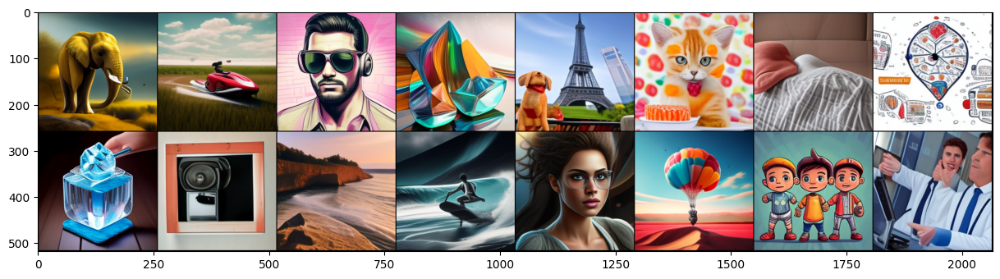

In [41]:
x_gen = generate_renoise(
    model=ladd_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    device=device,
    n_steps=4
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen))

# Shortcut

In [25]:
def generate_shortcut(model, vae, x_0, encoder_hidden_states, n_steps: int = 100, device: str = "cuda"):
    model.to(device)
    vae.to(device)
    model.eval()
    vae.eval()
    
    x_t = x_0.to(device)

    bs = x_0.shape[0]
    
    eps = 1e-8
    t = torch.linspace(eps, 1 - eps, n_steps + 1).to(device)
    h = 1 / n_steps 
    d = torch.tensor(h).to(device)
    
    for i in range(1, len(t)):
        t_prev = t[i - 1].unsqueeze(0).repeat((bs,))
        d_batch = d.unsqueeze(0).repeat((bs,))

        with torch.no_grad():
            f_eval = model(x_t, t_prev, d_batch, encoder_hidden_states=encoder_hidden_states).sample
            
        x_t = x_t + (t[i] - t[i - 1]) * f_eval

    with torch.no_grad():
        x_t = vae.decode(x_t / 0.18215).sample
    
    return x_t

In [22]:
def generate_euler_cfg_shortcut(model, vae, x_0, encoder_hidden_states, null_encoder_hidden_states, guidance_scale, n_steps: int = 100, device: str = "cuda"):
    model.to(device)
    model.eval()    

    x_t = x_0.to(device)

    bs = x_0.shape[0]
    
    eps = 1e-8
    t = torch.linspace(eps, 1 - eps, n_steps + 1).to(device)
    h = 1 / n_steps 
    d = torch.tensor(h).to(device)
    
    for i in range(1, len(t)):
        t_prev = t[i - 1].unsqueeze(0).repeat((bs,))
        d_batch = d.unsqueeze(0).repeat((bs,))
        
        with torch.no_grad():
            x_t_cond, x_t_uncond = model(
                      torch.cat([x_t, x_t], dim=0),
                      torch.cat([t_prev, t_prev], dim=0), 
                      torch.cat([d_batch, d_batch], dim=0), 
                      encoder_hidden_states=torch.cat([encoder_hidden_states, null_encoder_hidden_states], dim=0)
                  ).sample.chunk(2)
            
            k1 = (1 - guidance_scale) * x_t_uncond + guidance_scale * x_t_cond
            
            x_t = x_t + h * k1
    
    with torch.no_grad():
        x_t = vae.decode(x_t / 0.18215).sample
    
    return x_t


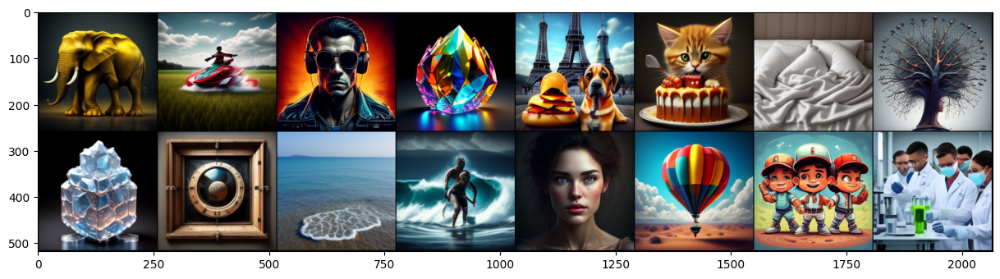

In [23]:
x_gen_cfg = generate_euler_cfg_shortcut(
    model=shortcut_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states, 
    guidance_scale=1,
    device=device,
    n_steps=4
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

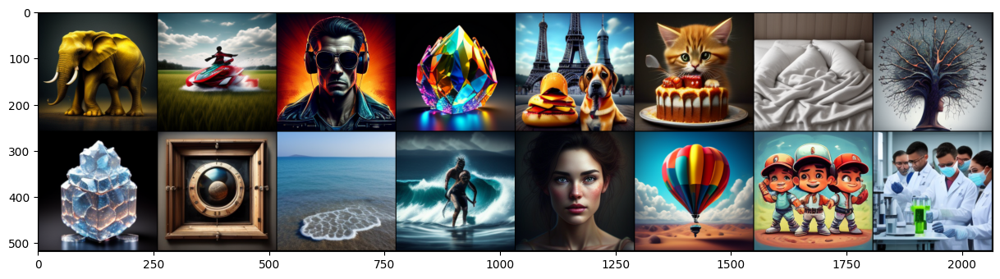

In [26]:
x_gen_cfg = generate_shortcut(
    model=shortcut_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    device=device,
    n_steps=4
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

# Half guidance

In [42]:
def generate_euler_half_cfg(unet, vae, x_0, encoder_hidden_states, null_encoder_hidden_states, guidance_scale, cfg_start: float = 0.5, n_steps: int = 100, device: str = "cuda"):
    unet.to(device)
    unet.eval()    

    x_t = x_0.to(device)

    bs = x_0.shape[0]
    
    eps = 1e-8
    t = torch.linspace(eps, 1 - eps, n_steps + 1).to(device)
    h = 1 / n_steps 
    
    for i in range(1, len(t)):
        t_prev = t[i - 1].unsqueeze(0).repeat((bs,))

        if t[i - 1] < cfg_start:
            with torch.no_grad():
                x_t_cond = unet(
                          x_t,
                          t_prev,
                          encoder_hidden_states
                      ).sample
                
                k1 = x_t_cond


        if t[i - 1] >= cfg_start:
            with torch.no_grad():
                x_t_cond, x_t_uncond = unet(
                          torch.cat([x_t, x_t], dim=0),
                          torch.cat([t_prev, t_prev], dim=0), 
                          encoder_hidden_states=torch.cat([encoder_hidden_states, null_encoder_hidden_states], dim=0)
                      ).sample.chunk(2)
                
                k1 = (1 - guidance_scale) * x_t_uncond + guidance_scale * x_t_cond
            
        x_t = x_t + h * k1
    
    with torch.no_grad():
        x_t = vae.decode(x_t / 0.18215).sample
    
    return x_t

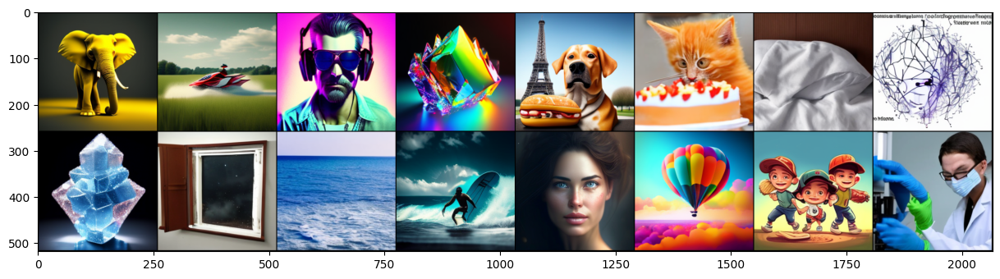

In [43]:
x_gen_cfg = generate_euler_half_cfg(
    unet=base_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states[:16], 
    guidance_scale=7,
    cfg_start=0.1,
    device=device,
    n_steps=100
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))

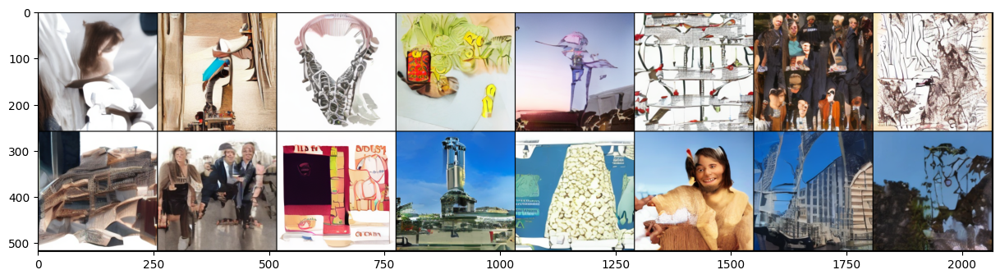

In [44]:
x_gen_cfg = generate_euler_half_cfg(
    unet=immiscible_unet, 
    vae=vae, 
    x_0=x_0_latent[:16], 
    encoder_hidden_states=encoder_hidden_states[:16], 
    null_encoder_hidden_states=null_encoder_hidden_states[:16], 
    guidance_scale=7,
    cfg_start=0.1,
    device=device,
    n_steps=100
)

plt.figure(figsize=(15, 7))
plt.imshow(show_images(x_gen_cfg))